In [1]:
import timeit
import json
import random
from itertools import permutations
import osmnx as ox
import networkx as nx
import pandas as pd
import sys
from math import sin, cos, sqrt, atan2, radians

# Bristol map

In [2]:
G_bri = ox.graph_from_place('Bristol, UK', network_type='drive')

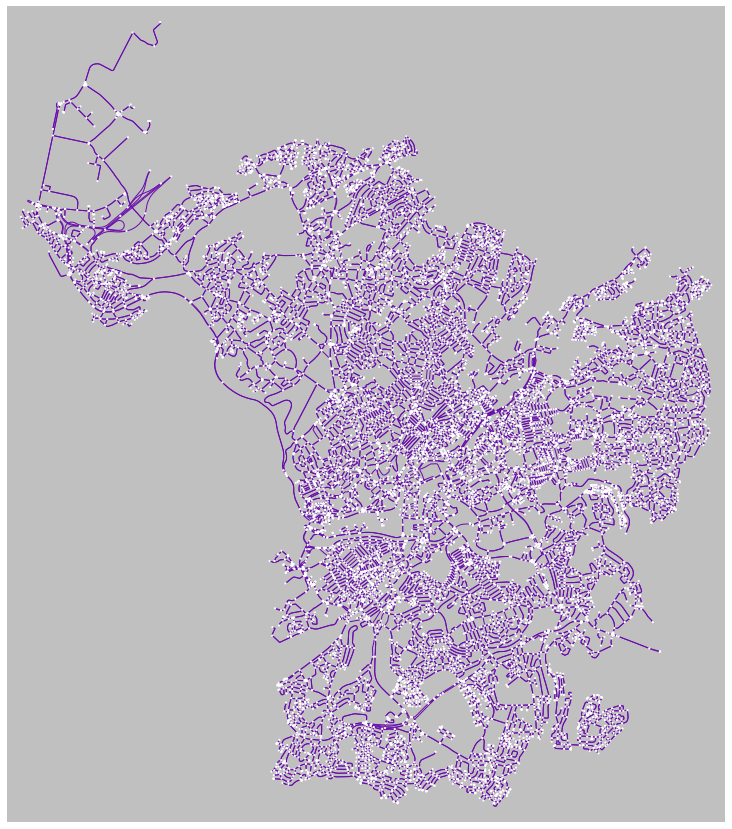

(<Figure size 1080x1080 with 1 Axes>, <AxesSubplot:>)

In [3]:
ox.plot_graph(G_bri, figsize=(15, 15), node_size=5, node_color='#FFFFFF', bgcolor='#C0C0C0', edge_color='#6a0dad')

# Points Generation

In [4]:
points = [3300238175,
 1651361949,
 544874799,
 2910979128,
 6894113732,
 18484731,
 26136140,
 6441478560,
 26372895,
 1401154272]
center = ox.get_nearest_node(G_bri, (51.454514, -2.587910))
points.append(center)
#points = random.choices(list(G_bri.nodes()), k=10)
points

[3300238175,
 1651361949,
 544874799,
 2910979128,
 6894113732,
 18484731,
 26136140,
 6441478560,
 26372895,
 1401154272,
 1797727475]

NOTE: точки були декілька разів рандомно перегенеровані і обраний найкращий варіант для розміщення їх по місту, а точка центру, то її кординати було взято в Інтернеті, як центр самого міста.

In [5]:
all_nodes = list(G_bri.nodes())
color = list()
nodes = list()
for i in range(len(all_nodes)):
    if all_nodes[i] in points:
        color.append('r')
        nodes.append(12)
    else:
        color.append('w')
        nodes.append(0)

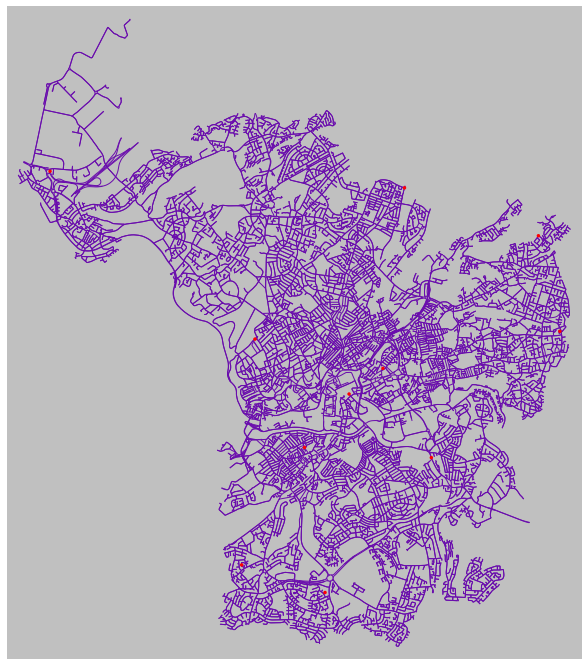

(<Figure size 864x864 with 1 Axes>, <AxesSubplot:>)

In [6]:
ox.plot_graph(G_bri, figsize=(12, 12), node_size=nodes, node_color=color, bgcolor='#C0C0C0', edge_color='#6a0dad')

# Routes

In [7]:
route_matrix = list()
len_matrix = list()
for i in range(len(points)):
    row_r = list()
    row_l = list()
    for j in range(len(points)):
        row_r.append(nx.shortest_path(G_bri, points[i], points[j], weight='length', method='dijkstra'))
        row_l.append(nx.shortest_path_length(G_bri, points[i], points[j], weight='length', method='dijkstra'))
    route_matrix.append(row_r)
    len_matrix.append(row_l)   

In [8]:
t_route_matrix = list()
t_len_matrix = list()
for i in range(len(points)):
    row_r = list()
    row_l = list()
    for j in range(len(points)):
        row_r.append(nx.shortest_path(G_bri, points[i], points[j], weight='time', method='dijkstra'))
        row_l.append(nx.shortest_path_length(G_bri, points[i], points[j], weight='time', method='dijkstra'))
    t_route_matrix.append(row_r)
    t_len_matrix.append(row_l)

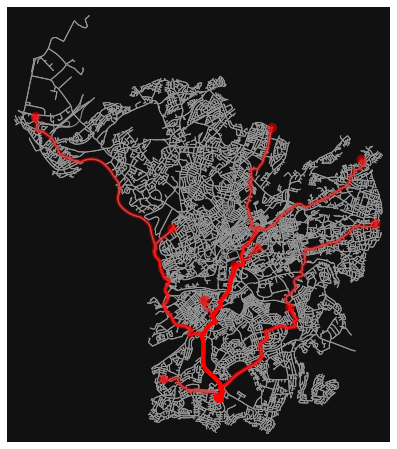

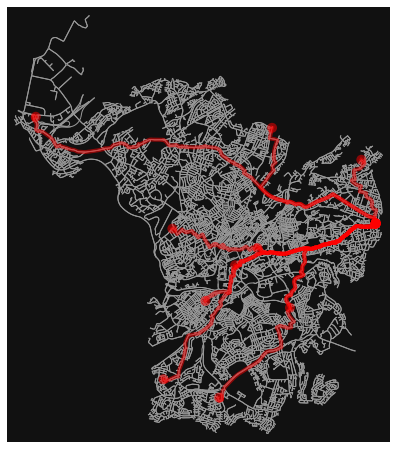

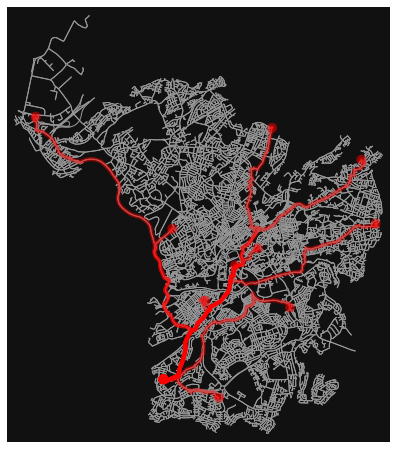

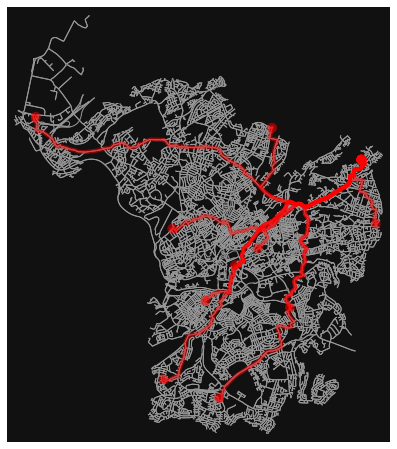

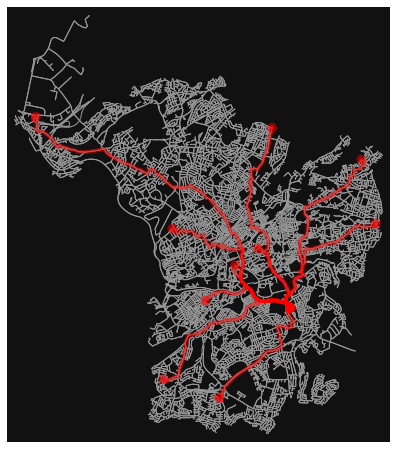

...

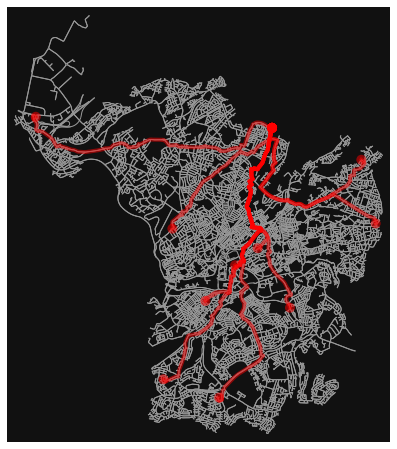

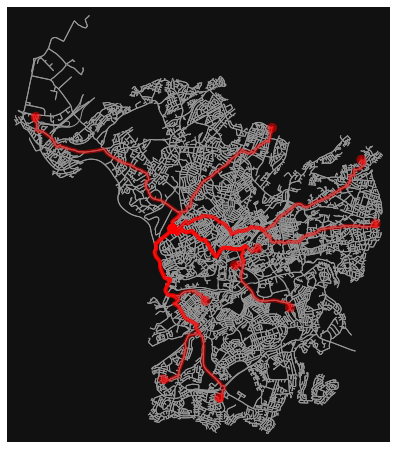

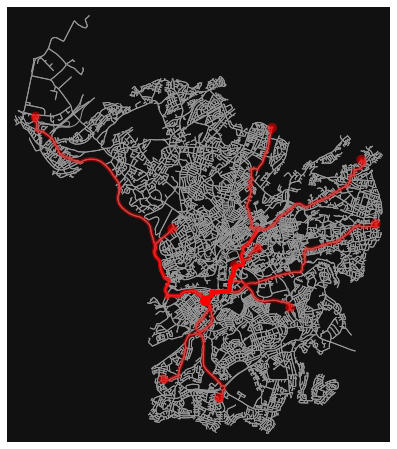

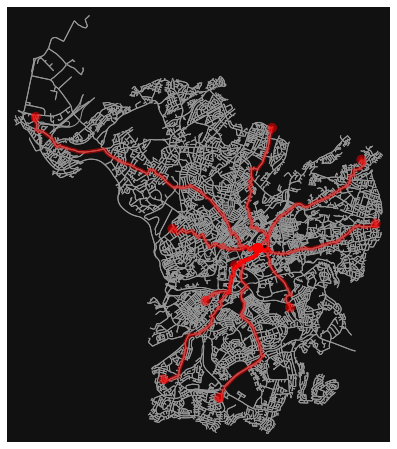

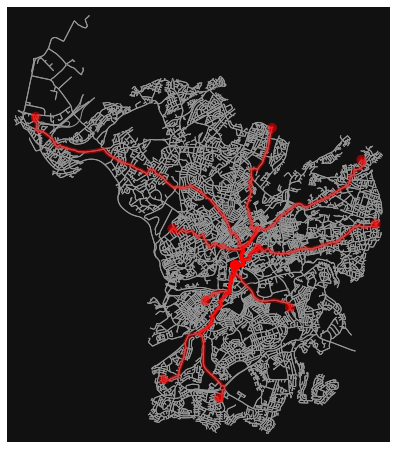

In [9]:
for i in range(len(points)): 
    ox.plot_graph_routes(G_bri, route_matrix[i], node_size=0)

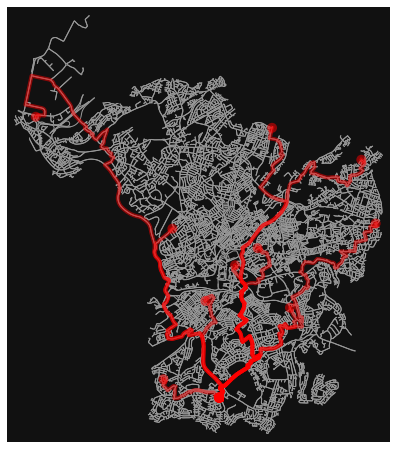

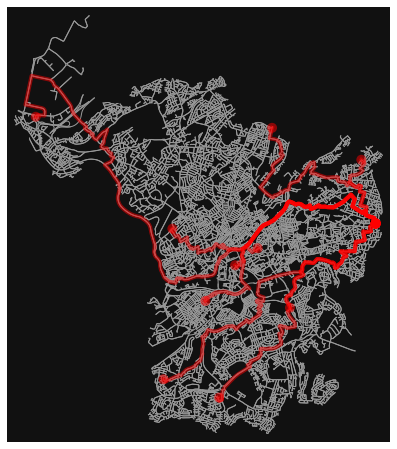

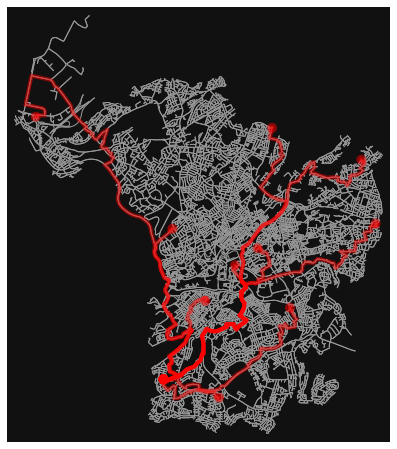

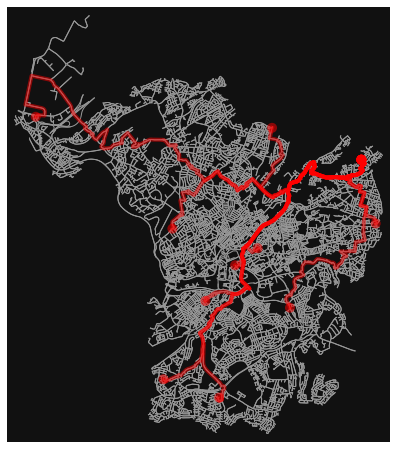

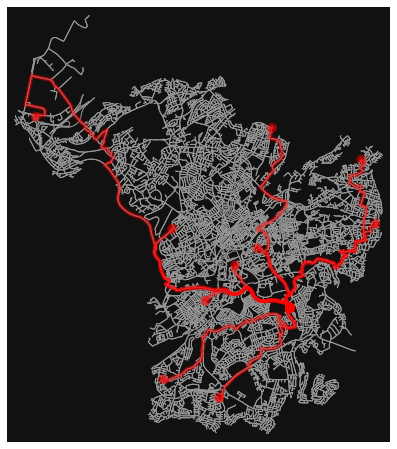

...

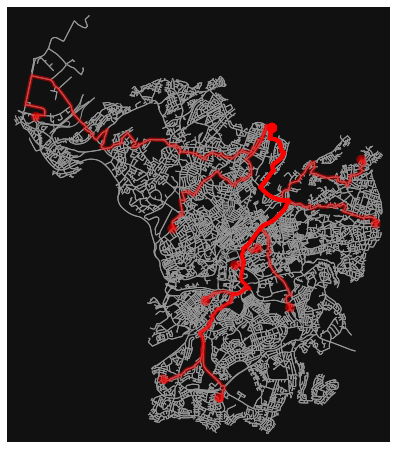

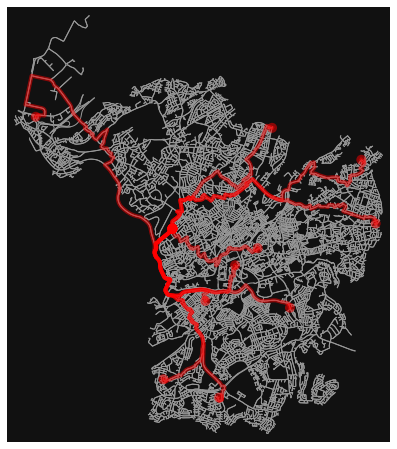

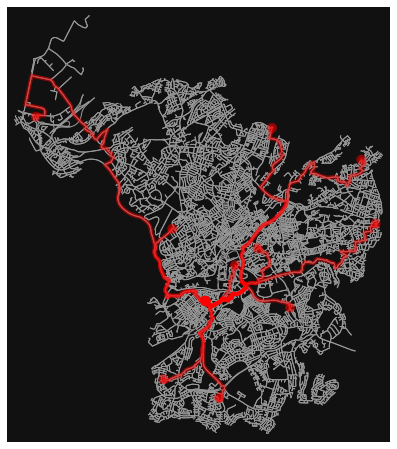

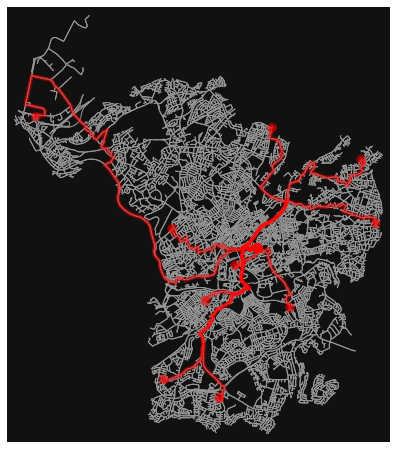

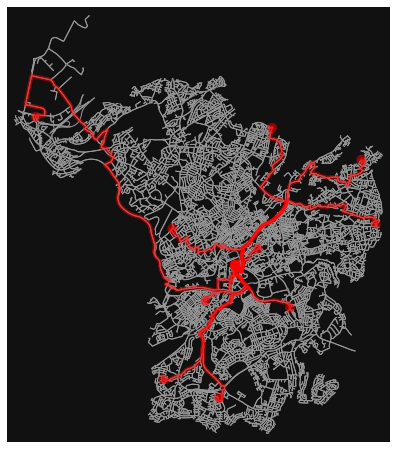

In [10]:
for i in range(len(points)): 
    ox.plot_graph_routes(G_bri, t_route_matrix[i], node_size=0)

# Travelling salesman problem

In [11]:
def SP(matrix):
    pathes = dict()
    center = 10
    v = list()
    for i in range(len(points)): 
        if i != center: 
            v.append(i)
    permutation=permutations(v)
    for i in permutation:
        c_w = 0
        k = center
        for j in i:
            c_w += matrix[k][j]
            k = j
        c_w += matrix[k][center]
        pathes[c_w] = i
    return pathes

In [12]:
min_path = SP(len_matrix)

In [13]:
values = [i for i in min_path.keys()]
min_path_nodes_num = min_path[min(values)]
min_matrix_path = list()
k = -1
for i in range(len(min_path_nodes_num)):
    min_matrix_path.append(route_matrix[k][min_path_nodes_num[i]])
    k = min_path_nodes_num[i]
min_matrix_path.append(route_matrix[k][-1])

In [14]:
min_path_nodes_num 

(9, 7, 5, 6, 3, 1, 4, 0, 2, 8)

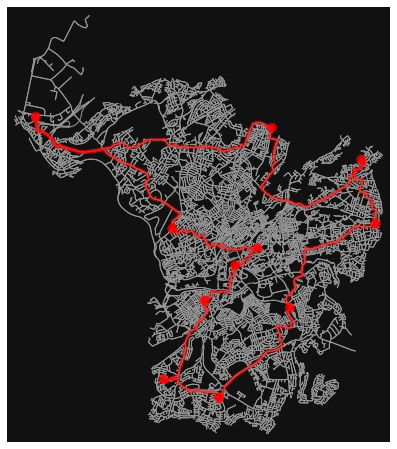

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [15]:
ox.plot_graph_routes(G_bri, min_matrix_path, node_size=0)

In [16]:
min_path = SP(t_len_matrix)

In [17]:
values = [i for i in min_path.keys()]
min_path_nodes_num = min_path[min(values)]
min_matrix_path = list()
k = -1
for i in range(len(min_path_nodes_num)):
    min_matrix_path.append(t_route_matrix[k][min_path_nodes_num[i]])
    k = min_path_nodes_num[i]
min_matrix_path.append(route_matrix[k][-1])

In [18]:
min_path_nodes_num 

(1, 3, 6, 5, 7, 8, 2, 0, 4, 9)

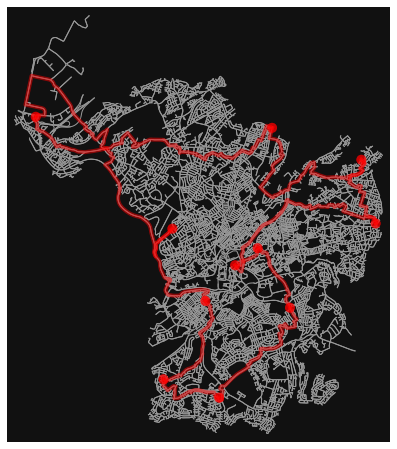

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [19]:
ox.plot_graph_routes(G_bri, min_matrix_path, node_size=0)

# Ubermovement

In [20]:
def SP(G, start):
    d = dict()
    rev_d = dict()
    for i in range(len(list(G.nodes()))):
        d[list(G.nodes())[i]] = i
        rev_d[i] = list(G.nodes())[i]
    distance = [99999999999] * len(list(G.nodes()))
    distance[d[start]] = 0
    pathes = list()
    dict_node_length = {start: 0}
    while dict_node_length:
        source_node = min(dict_node_length, key = lambda k: dict_node_length[k])
        del dict_node_length[source_node]
        for node_dist in G.neighbors(source_node):
            new_way = list()
            new_way.append(source_node)
            adjnode = node_dist
            length_to_adjnode = G[source_node][adjnode][0]['length']
            if distance[d[adjnode]] > distance[d[source_node]] + length_to_adjnode:
                distance[d[adjnode]] = distance[d[source_node]] + length_to_adjnode
                dict_node_length[adjnode] = distance[d[adjnode]]
                new_way.append(adjnode)
        pathes.append(new_way)
    #for i in range(len(list(G.nodes()))) :
    #        print("Source Node ("+str(start)+")  -> Destination Node(" + str(rev_d[i]) + ")  : " + str(distance[i]))
    return distance, pathes

In [21]:
def SPC(G, dist, dest):
    index = list(G.nodes()).index(dest)
    return dist[index]

In [22]:
dis, pathes  = SP(G_bri, 104804)
length = SPC(G_bri, dis, 104805)

In [61]:
df = pd.read_csv("bristol-msoa-2020-1-All-HourlyAggregate.csv")
df

,sourceid,dstid,hod,mean_travel_time,standard_deviation_travel_time,geometric_mean_travel_time,geometric_standard_deviation_travel_time
0,143,141,7,879.98,531.30,723.19,2.05
1,184,44,22,872.83,250.69,837.99,1.33
2,144,131,7,779.55,178.54,760.33,1.25
3,142,151,7,1125.10,213.11,1106.60,1.20
4,16,93,11,676.17,199.40,646.85,1.38
...,...,...,...,...,...,...,...
166758,100,19,10,700.14,232.61,669.49,1.34
166759,25,2,1,953.21,306.02,913.35,1.32
166760,82,139,1,518.70,226.18,491.12,1.34
166761,83,129,1,592.98,246.44,555.25,1.41


In [24]:
with open('bristol_msoa.json') as json_file:
    data = json.load(json_file)
data

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'msoa11cd': 'E02003033',
    'MOVEMENT_ID': '1',
    'DISPLAY_NAME': 'Bristol 022'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-2.6079851, 51.4716684],
      [-2.6078223, 51.471592],
      [-2.6075074, 51.4714921],
      [-2.6069801, 51.4713536],
      [-2.6068524, 51.471294],
      [-2.6066954, 51.4711626],
      [-2.6062996, 51.4707304],
      [-2.6062269, 51.4706723],
      [-2.6057846, 51.4704454],
      [-2.6049245, 51.4701853],
      [-2.604747, 51.470144],
      [-2.604698, 51.4701578],
      [-2.6044837, 51.4701413],
      [-2.6040962, 51.4696499],
      [-2.6041869, 51.4696923],
      [-2.6048037, 51.4695782],
      [-2.6047319, 51.469517],
      [-2.6038611, 51.4684774],
      [-2.6038183, 51.4685133],
      [-2.6023285, 51.4690785],
      [-2.6021964, 51.4689971],
      [-2.6017619, 51.469237],
      [-2.6014393, 51.469034],
      [-2.6013741, 51.46893],
      [-2.6011961, 51.468

In [34]:
coor = list()
for feature in data["features"]:
    cor = feature['geometry']['coordinates'][0][0]
    if type(feature['geometry']['coordinates'][0][0][0]) == type(list()):
        cor = [0, 0]
    coor.append(cor)
coor[266]

[-2.5699749, 51.4661334]

In [26]:
travel = list()
travel.append(points[-1])
for i in range(len(min_path_nodes_num)):
    travel.append(points[min_path_nodes_num[i]])
travel.append(points[-1])

In [30]:
def dist(p1, p2):
    R = 6371e3
    lat1 = radians(p1[1])
    lat2 = radians(p2[1])
    lon1 = radians(p1[0])
    lon2 = radians(p2[0])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

In [45]:
def nodes_ids():
    nodes_ids = {}
    for node in travel:
        min_dst = sys.maxsize
        for coordinates in coor:
            dst = dist([G_bri.nodes[node]['x'], G_bri.nodes[node]['y']], coordinates) 
            if dst < min_dst:
                min_dst = dst
                min_id = coor.index(coordinates)
        nodes_ids[node] = min_id
    return nodes_ids
nearest_ids = nodes_ids()
nearest_ids

{1797727475: 264,
 1651361949: 4,
 2910979128: 90,
 26136140: 82,
 18484731: 103,
 6441478560: 3,
 26372895: 16,
 544874799: 26,
 3300238175: 27,
 6894113732: 18,
 1401154272: 264}

In [66]:
keys = [i for i in nearest_ids.values()]
keys
for i in range(len(keys) - 1):
    v = (df['mean_travel_time'][(df['sourceid'] == keys[i]) & (df['dstid'] == keys[i + 1])])
    print(v)

Series([], Name: mean_travel_time, dtype: float64)
2932       743.22
4681       775.82
10903      831.73
22084      840.59
58989     1258.26
60375      860.25
62984     1055.62
68415     1002.68
75943      731.46
83512      936.80
90818      704.56
91260     1019.38
100708     679.96
104454     866.21
115562    1094.02
120393     814.11
124679     804.25
125472    1172.22
136962     731.14
140189     907.97
146002     851.16
154909     945.71
156299     936.39
157351     904.97
Name: mean_travel_time, dtype: float64
3496       706.18
4852       635.54
10466      795.94
38513      724.69
39919      987.57
41923      689.50
42829      717.69
48973      962.96
55240      618.69
58075     1032.73
58192      653.87
69394      905.70
90631      718.63
94832      870.48
99108      938.84
104219     892.35
111498    1064.34
114772     844.43
114944     719.97
132278     669.00
139750     802.35
149531     934.92
151734     663.31
156661     762.40
Name: mean_travel_time, dtype: float64
Series(